# Table of Contents
1. Importing and loading in Zenodo data.
2. Creating preliminary density plots using KP index.
3. Create a statistical analysis of KP index value and magnitude of radial diffusion.

## Importing and Loading Zenodo data

### Roadmap
1. Import all necessary libraries.
2. Load in the entirety of the DLL Zenodo 1995 data.
3. Add columns to the DLL Zenodo 1995 data that allow us to better track and visualize magnitude of radial diffusion at certain times throughout the year (mostly through use of the hour column).
4. Convert data to useable (numeric) types (they're imported as strings).
5. Load in and cast KP-10 index data from NASA.
6. Merge KP-10 index data with DLL Zenodo 1995 data

In [1]:
# imports!
import numpy as np
import pandas as pd
import scipy as sp
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn as sk
import datetime
from scipy.stats import iqr
#from sklearn.linear_model import LinearRegression

#import NotebookApp

# changing data_rate_limit
#--NotebookApp.iopub_data_rate_limit = 1e10
#--NotebookApp.iopub_data_rate_limit

In [2]:
# Converting data to list

f = open("DLL_zenodo_1995_T1h.txt", "r")
#f.read(50)

lines = [next(f) for _ in range(408134)]  # first 100 lines
remainder_of_file = f.read()  
f.close() 


In [3]:
#making a nested list - possible implemmentation 
dataframe = []
for line in lines[21:]:
    data = line.split()
    dataframe.append(data)
    
df_1995 = pd.DataFrame(dataframe, columns = ["Date", "Day-of-year", "Time", "hourly avg location for the magnetopause B_barre", "hourly variance for the magnetopause", "lifetime for the autocorrelation function", "magnitude for radial diffusion"] )
df_1995


,Date,Day-of-year,Time,hourly avg location for the magnetopause B_barre,hourly variance for the magnetopause,lifetime for the autocorrelation function,magnitude for radial diffusion
0,1995/01/01,001,04:17,9.73e+00,3.60e-03,2.05e+00,-9.11e+00
1,1995/01/01,001,04:19,9.73e+00,3.24e-03,2.22e+00,-9.12e+00
2,1995/01/01,001,04:21,9.73e+00,3.29e-03,2.23e+00,-9.12e+00
3,1995/01/01,001,04:23,9.73e+00,3.20e-03,2.25e+00,-9.12e+00
4,1995/01/01,001,04:24,9.73e+00,3.12e-03,2.26e+00,-9.13e+00
...,...,...,...,...,...,...,...
408108,1995/12/31,365,23:54,1.00e+01,1.16e-02,3.63e+00,-8.48e+00
408109,1995/12/31,365,23:55,1.00e+01,1.20e-02,4.09e+00,-8.41e+00
408110,1995/12/31,365,23:56,1.00e+01,1.23e-02,4.31e+00,-8.38e+00
408111,1995/12/31,365,23:57,1.00e+01,1.26e-02,4.48e+00,-8.35e+00


In [4]:
#converted Date to D
from datetime import datetime

df_1995["Date"] = pd.to_datetime(df_1995["Date"])
type(df_1995["Date"][0])
#dataframe_final_ish["Time"] = pd.to_datetime(dataframe_final_ish["Time"])

pandas._libs.tslibs.timestamps.Timestamp

In [5]:
def hourstr_to_time(str):
    hour = str[0:2]
    if hour[0] == 0:
        hour = hour[1:]
    return int(hour)

df_1995["Hour"] = df_1995["Time"].apply(hourstr_to_time)
df_1995

,Date,Day-of-year,Time,hourly avg location for the magnetopause B_barre,hourly variance for the magnetopause,lifetime for the autocorrelation function,magnitude for radial diffusion,Hour
0,1995-01-01,001,04:17,9.73e+00,3.60e-03,2.05e+00,-9.11e+00,4
1,1995-01-01,001,04:19,9.73e+00,3.24e-03,2.22e+00,-9.12e+00,4
2,1995-01-01,001,04:21,9.73e+00,3.29e-03,2.23e+00,-9.12e+00,4
3,1995-01-01,001,04:23,9.73e+00,3.20e-03,2.25e+00,-9.12e+00,4
4,1995-01-01,001,04:24,9.73e+00,3.12e-03,2.26e+00,-9.13e+00,4
...,...,...,...,...,...,...,...,...
408108,1995-12-31,365,23:54,1.00e+01,1.16e-02,3.63e+00,-8.48e+00,23
408109,1995-12-31,365,23:55,1.00e+01,1.20e-02,4.09e+00,-8.41e+00,23
408110,1995-12-31,365,23:56,1.00e+01,1.23e-02,4.31e+00,-8.38e+00,23
408111,1995-12-31,365,23:57,1.00e+01,1.26e-02,4.48e+00,-8.35e+00,23


In [6]:
df_1995["magnitude for radial diffusion"] = pd.to_numeric(df_1995["magnitude for radial diffusion"])
df_1995["hourly variance for the magnetopause"] = pd.to_numeric(df_1995["hourly variance for the magnetopause"])
df_1995["hourly avg location for the magnetopause B_barre"] = pd.to_numeric(df_1995["hourly avg location for the magnetopause B_barre"])
df_1995["lifetime for the autocorrelation function"] = pd.to_numeric(df_1995["lifetime for the autocorrelation function"])
df_1995["Total Minutes"] = df_1995["Time"].str[0:2].astype(float) * 60 + df_1995["Time"].str[3:].astype(float)
df_1995

,Date,Day-of-year,Time,hourly avg location for the magnetopause B_barre,hourly variance for the magnetopause,lifetime for the autocorrelation function,magnitude for radial diffusion,Hour,Total Minutes
0,1995-01-01,001,04:17,9.73,0.00360,2.05,-9.11,4,257.0
1,1995-01-01,001,04:19,9.73,0.00324,2.22,-9.12,4,259.0
2,1995-01-01,001,04:21,9.73,0.00329,2.23,-9.12,4,261.0
3,1995-01-01,001,04:23,9.73,0.00320,2.25,-9.12,4,263.0
4,1995-01-01,001,04:24,9.73,0.00312,2.26,-9.13,4,264.0
...,...,...,...,...,...,...,...,...,...
408108,1995-12-31,365,23:54,10.00,0.01160,3.63,-8.48,23,1434.0
408109,1995-12-31,365,23:55,10.00,0.01200,4.09,-8.41,23,1435.0
408110,1995-12-31,365,23:56,10.00,0.01230,4.31,-8.38,23,1436.0
408111,1995-12-31,365,23:57,10.00,0.01260,4.48,-8.35,23,1437.0


In [7]:
#unnecessary ufnction 
def time_since_jan1_1995data(parameter):
    hour = parameter[0]
    day = parameter[1]
    if day[0] == '0':
        day = day[1:]
    if hour[0] == '0':
        hour = hour[1:]

    return day * 24 + hour


In [8]:
group_hour_doy = df_1995.groupby(["Hour", "Day-of-year"]).mean()

group_hour_doy["Index"] = group_hour_doy.index
#group_hour_doy["Total Hours"] = group_hour_doy["Index"].apply(time_since_jan1_1995data)
group_hour_doy

hourly avg location for the magnetopause B_barre  \
Hour Day-of-year                                                     
0    002                                                  8.633846   
     003                                                  9.068475   
     004                                                  9.646600   
     005                                                  9.786579   
     007                                                  9.948250   
...                                                            ...   
23   359                                                  9.079574   
     362                                                 10.436957   
     363                                                  9.701333   
     364                                                  9.331228   
     365                                                  9.968983   

                  hourly variance for the magnetopause  \
Hour Day-of-year                                         
0    002                                      0.005154   
     003                                      0.069800   
     004                                      0.021874   
     005                                      0.010650   
     007                                      0.009646   
...                                                ...   
23   359                                      0.043917   
     362                                      0.003500   
     363                                      0.014268   
     364                                      0.004957   
     365                                      0.016511   

                  lifetime for the autocorrelation function  \
Hour Day-of-year                                              
0    002                                           2.694615   
     003                                           3.673898   
     004                                           1.510600   
     005                                           5.860263   
     007                                           2.752250   
...                                                     ...   
23   359                                           5.137234   
     362                                           5.483696   
     363                                          10.353000   
     364                                           2.094035   
     365                                           5.114237   

                  magnitude for radial diffusion  Total Minutes      Index  
Hour Day-of-year                                                            
0    002                               -8.332308      11.538462   (0, 002)  
     003                               -7.306610      29.033898   (0, 003)  
     004                               -8.428200      28.340000   (0, 004)  
     005                               -8.322105      32.921053   (0, 005)  
     007                               -8.671750      31.925000   (0, 007)  
...                                          ...            ...        ...  
23   359                               -7.352766    1410.702128  (23, 359)  
     362                               -9.112174    1408.478261  (23, 362)  
     363                               -7.845833    1409.500000  (23, 363)  
     364                               -8.842281    1409.000000  (23, 364)  
     365                               -8.350508    1409.000000  (23, 365)  

[7968 rows x 6 columns]

In [9]:
# prelim_viz = sns.lmplot(x="Time since midnight", y="magnitude for radial diffusion", data=df_1995)

In [10]:
#prelim_viz = sns.lmplot(x="Time since midnight", y="hourly variance for the magnetopause", data=df_1995)

In [11]:
#making density plots 
# sns.kdeplot(x=df_1995["Time since midnight"], y = df_1995["magnitude for radial diffusion"])
# plt.title('KDE Plot Comparison of x vs y')

In [12]:
# loading hourly avg of KP-Indexes from 1995
f = open("1995 KP-10 index -- hourly avg.lst", "r")
lines = [next(f) for _ in range(8760)]
remainder_of_file = f.read()
f.close()

In [13]:
#year, day of year, kp index, hour
dataframe = []
for line in lines:
    data = line.split()
    dataframe.append(data)
    
kpdf = pd.DataFrame(dataframe, columns = ["Year", "Day-of-year", "Hour", "Kp-index"])
kpdf["Day-of-year"] = kpdf["Day-of-year"].astype(int)
kpdf["Hour"] = kpdf["Hour"].astype(int)
kpdf["Kp-index"] = kpdf["Kp-index"].astype(int)
time_since_jan_1 = kpdf["Hour"] + (kpdf["Day-of-year"] * 24) - 24
kpdf["Total Hours"] = time_since_jan_1
kpdf.head()

,Year,Day-of-year,Hour,Kp-index,Total Hours
0,1995,1,0,10,0
1,1995,1,1,10,1
2,1995,1,2,10,2
3,1995,1,3,0,3
4,1995,1,4,0,4


In [14]:
merged_df = kpdf.merge(df_1995, left_index= True, right_index = True)
merged_df.head()

,Year,Day-of-year_x,Hour_x,Kp-index,Total Hours,Date,Day-of-year_y,Time,hourly avg location for the magnetopause B_barre,hourly variance for the magnetopause,lifetime for the autocorrelation function,magnitude for radial diffusion,Hour_y,Total Minutes
0,1995,1,0,10,0,1995-01-01,001,04:17,9.73,0.00360,2.05,-9.11,4,257.0
1,1995,1,1,10,1,1995-01-01,001,04:19,9.73,0.00324,2.22,-9.12,4,259.0
2,1995,1,2,10,2,1995-01-01,001,04:21,9.73,0.00329,2.23,-9.12,4,261.0
3,1995,1,3,0,3,1995-01-01,001,04:23,9.73,0.00320,2.25,-9.12,4,263.0
4,1995,1,4,0,4,1995-01-01,001,04:24,9.73,0.00312,2.26,-9.13,4,264.0


## Creating Visualizations
### Roadmap
1. Create general density plots of various KP-indices and see how often they appear within our data.
2. Create a bivariate density plot of KP-index and day of year, generally seeing how tightly "clustered" our data is throughout the year on a low-resolution scale.
3. See generally how KP-index fluctuates on a high-resolution scale of hourly average, with each separate color showing how frequently a KP-index occurs throughout the year.
4. See generally what the relationship is with KP-index and hour through creating linear density plots in an attempt to see a linear relation.

/tmp/ipykernel_290/1579008792.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(a= merged_df["Kp-index"], bins=40, color='purple',


<AxesSubplot: xlabel='Kp-index', ylabel='Density'>

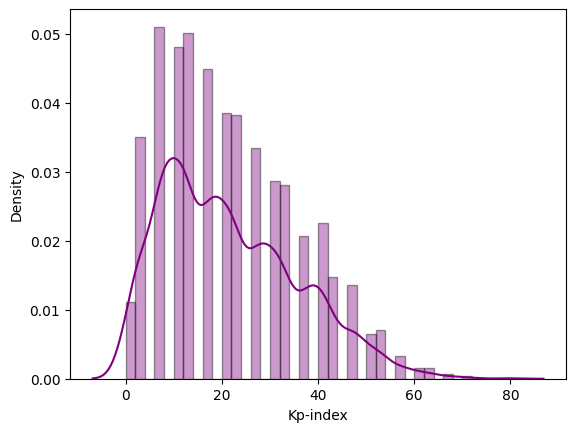

In [15]:
#plotting density plots to get a better understanding how Kp index
sns.distplot(a= merged_df["Kp-index"], bins=40, color='purple',
             hist_kws={"edgecolor": 'black'})

[Text(0.5, 1.0, 'Bivariate density plot of the Kp-index and the Day of the Year')]

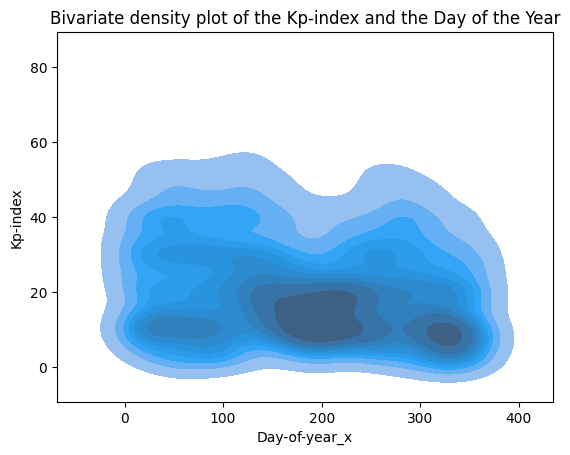

In [16]:
sns.kdeplot(data = merged_df, x = "Day-of-year_x", y = "Kp-index", fill = True).set(title='Bivariate density plot of the Kp-index and the Day of the Year')

#the three "holes" in the graph show where the highest concentration of points are
#from this plot, we can see that the concentration of points mainly occur at certain parts of the year (beginning, middle, end) and the kp-index is generally below 30
# shows that there is seasonality in the Kp-index because the seasons affect the magnetic field. 
# center of rotation of the Earth gets different amounts of heat in different seasons so the magnetic field changes -> geometric changes 

In [17]:
#sns.kdeplot(data = merged_df, x = "Hour_x", y = "Kp-index"). set(title = 'Bivariate density plot of the Kp-index and the Hour of the Day')

[Text(0.5, 1.0, 'Density of Kp-index by Hour')]

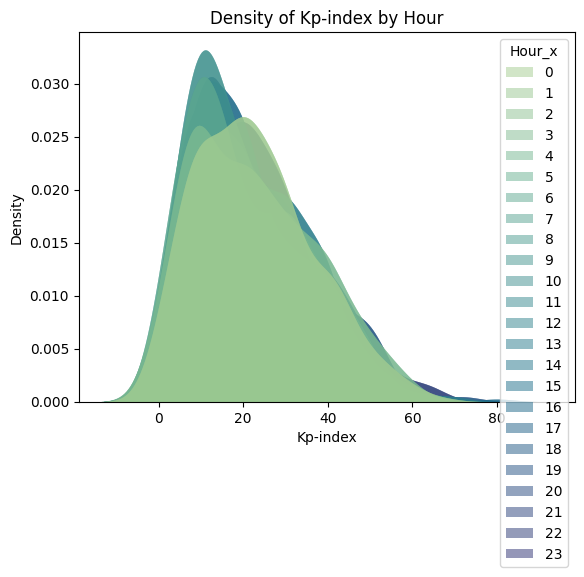

In [18]:
sns.kdeplot(
   data=merged_df, x= "Kp-index", hue="Hour_x",
   fill=True, common_norm=False, palette="crest",
   alpha=.5, linewidth=0,
).set(title = "Density of Kp-index by Hour")

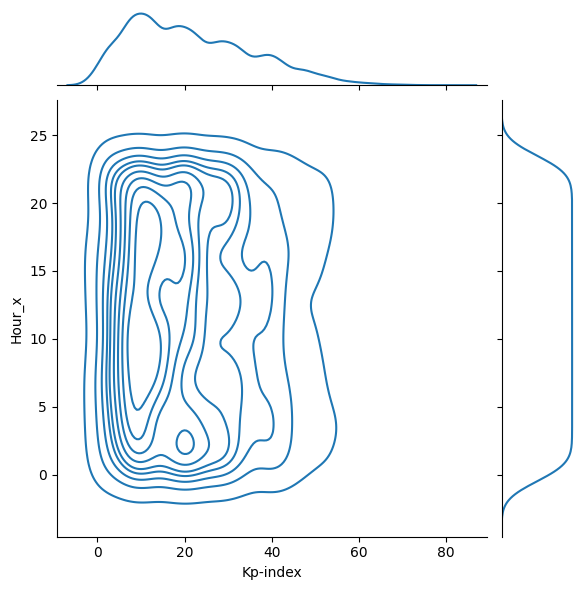

In [19]:
sns.jointplot(
    data=merged_df,
    x="Kp-index", y="Hour_x",
    kind="kde"
)


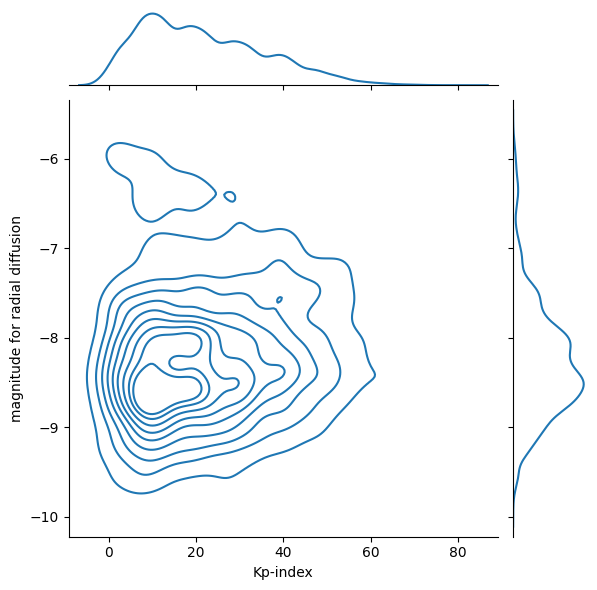

In [20]:
sns.jointplot(
    data=merged_df,
    x="Kp-index", y="magnitude for radial diffusion",
    kind="kde"
)

#doesn't seem to be too much linear correlation between kp-index and magnitude for radial diffusion - maybe we should apply some transformations?

In [21]:
#correlation coefficient between kp-index and magnitude for radial diffusion 
np.corrcoef(merged_df["Kp-index"], merged_df["magnitude for radial diffusion"])

array([[1.        , 0.12045254],
       [0.12045254, 1.        ]])

## A Statistical Look into the Magnitude of Radial Diffusion at Different KP-Indexes throughout 1995

### Roadmap
1. Create a new dataframe in which we will take the mode of the magnitude of radial diffusion at each KP-index.
2. Create a new dataframe in which we will take the median of the magnitude of radial diffusion at each KP-index, separate from time. Similarly, create an interquartile range of values for each index.
3. Visualize the relationships between the magnitude of radial diffusion and KP-index.

### Purpose
The purpose of performing this statistical analysis is to remove the time element and see if, in general, there is an association between KP-index and magnitude of radial coefficient. These following blocks come after struggling to find linear relation in our visualizations, and by the advice of our instructor, Solene. :-)


In [23]:
# create a grouped dataframe, selecting only Kp-index and magnitude of radial diffusion.
# We will first be finding the median of the magnitude of radial diffusion at each index.

selected_kp_merge = merged_df.iloc[:, [3, 11]]
median_kp_95 = selected_kp_merge.groupby("Kp-index").median()
median_kp_95

,magnitude for radial diffusion
Kp-index,
0,-8.400
3,-8.340
7,-8.480
10,-8.420
13,-8.430
17,-8.405
20,-8.270
23,-8.400
27,-8.390


<AxesSubplot: xlabel='Kp-index'>

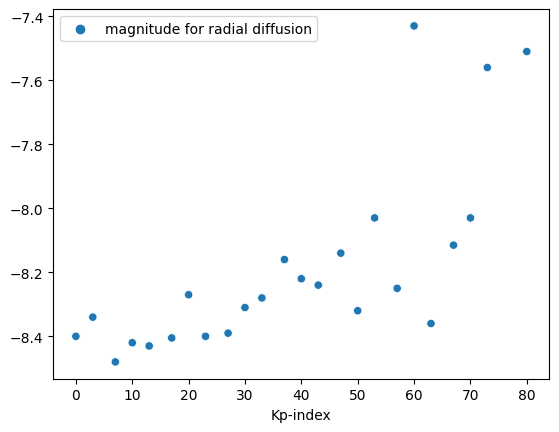

In [24]:
# creating a visual scatterplot of the data

sns.scatterplot(median_kp_95)

From visualization of the median alone, we can see there is a positive association, though rather than having linear relation, it seems to be exponential. We can compare this to mean and mode. From here, we first plot mean, then mode.

In [25]:
# create a dataframe of the average

average_kp_95 = selected_kp_merge.groupby(["Kp-index"]).mean()
average_kp_95

,magnitude for radial diffusion
Kp-index,
0,-8.260000
3,-8.241610
7,-8.392427
10,-8.277094
13,-8.309602
17,-8.306794
20,-8.189985
23,-8.357698
27,-8.298564


<AxesSubplot: xlabel='Kp-index'>

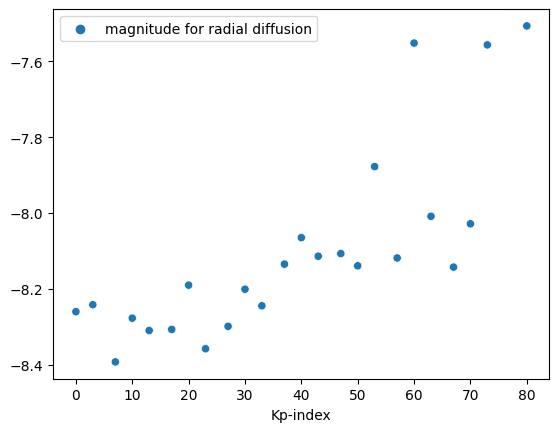

In [26]:
sns.scatterplot(average_kp_95)

In [27]:
# create a dataframe of the mode

mode_kp_95 = selected_kp_merge.groupby(["Kp-index"])['magnitude for radial diffusion'].apply(pd.Series.mode)
mode_kp_95

Kp-index   
0         0   -8.37
3         0   -7.62
7         0   -8.77
10        0   -8.78
          1   -8.58
13        0   -8.53
17        0   -8.59
20        0   -8.10
23        0   -8.64
          1   -8.59
          2   -8.21
27        0   -8.57
          1   -8.47
          2   -8.42
30        0   -8.47
33        0   -8.69
          1   -8.45
          2   -8.02
37        0   -8.46
40        0   -8.29
          1   -8.28
43        0   -8.36
          1   -8.35
47        0   -8.78
          1   -8.36
          2   -8.16
          3   -8.06
50        0   -8.49
          1   -8.48
53        0   -8.30
          1   -8.04
57        0   -8.90
          1   -8.40
          2   -8.33
          3   -8.28
          4   -8.05
          5   -8.02
          6   -7.64
          7   -6.86
60        0   -8.06
          1   -7.43
          2   -7.14
          3   -7.13
63        0   -8.51
          1   -8.50
          2   -8.46
          3   -8.40
67        0   -7.85
          1   -7.84
70      

As the mode produces a Multi-Index object, I cannot perform a visualization on it. However, from its similarities to the median and mean data, it is assumable that the visualization will take on the same general form. What's interesting to note is that there are multiple nodes for several different KP-indices, especially going from 23 and upwards. We can take this to mean there is greater variability with higher KP-indices when going to higher values, but we struggle to understand what this potentially means going forward.

### Variability Analysis
While our mean, median, and mode of KP-index relation to magnitude of radial diffusion don't differ too much, it is pertinent to reveal how "tight" those bounds are in relation to all other data points within its group.

We will proceed with two methods of measuring variability: standard deviation and IQR. Currently, we have standard deviation only, though we wish to pursue further analysis of the IQR.

In [28]:
# creating a std data frame for KP-indices

std_kp_95 = selected_kp_merge.groupby(["Kp-index"]).std()
std_kp_95

,magnitude for radial diffusion
Kp-index,
0,0.829635
3,0.721866
7,0.649059
10,0.757218
13,0.640607
17,0.596241
20,0.655220
23,0.534775
27,0.665091


<AxesSubplot: xlabel='Kp-index'>

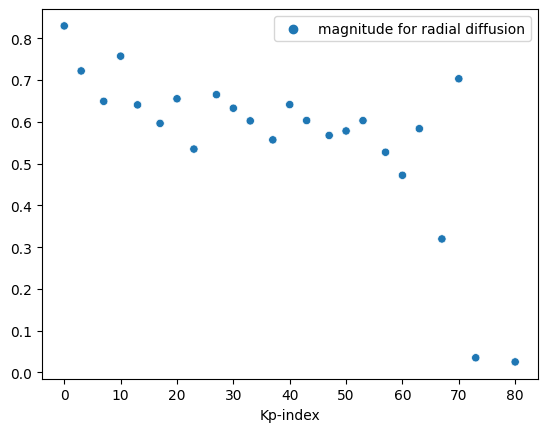

In [29]:
sns.scatterplot(std_kp_95)

# E-Index Data

In [ ]:
f = open("E-Index 1995 data.lst", "r")
#f.read(50)

lines = [next(f) for _ in range(8760)]
remainder_of_file = f.read()  
f.close()

In [31]:
E_index_columns = ["Year", "Day of year", "Hour", "Scalar B, nT", "Vector B Magnitude,nT", "Lat. Angle of B (GSE)", "Long.Angle of B (GSE)", "BX, nT (GSE, GSM)", "BY, nT (GSE)", "BZ, nT (GSE)", "BY, nT (GSM)", "BZ, nT (GSM)", "RMS_magnitude, nT", "RMS_field_vector, nT", "RMS_BX_GSE, nT", "RMS_BY_GSE, nT", "RMS_BZ_GSE, nT", "SW Plasma Temperature, K", "SW Proton Density", "SW Plasma Speed", "SW Plasma flow long. angle", "SW Plasma long lat angle", "Alpha/Prot. ratio", "sigma-T, K", "sigma-n, N/cm^3", "sigma-V", "sigma-phi V", "sigma-theta V", "sigma-ratio", "Flow pressure", "E electric field", "Plasma Beta", "Alfen mach number", "Magnetosonic Much num", "Quasy-Invariant", "AE-index, nT"]

In [32]:
#making a nested list - possible implemmentation 
dataframe = []
for line in lines:
    data = line.split()
    dataframe.append(data)

E_index_columns = ["Year", "Day of year", "Hour", "Scalar B, nT", "Vector B Magnitude,nT", "Lat. Angle of B (GSE)", "Long.Angle of B (GSE)", "BX, nT (GSE, GSM)", "BY, nT (GSE)", "BZ, nT (GSE)", "BY, nT (GSM)", "BZ, nT (GSM)", "RMS_magnitude, nT", "RMS_field_vector, nT", "RMS_BX_GSE, nT", "RMS_BY_GSE, nT", "RMS_BZ_GSE, nT", "SW Plasma Temperature, K", "SW Proton Density", "SW Plasma Speed", "SW Plasma flow long. angle", "SW Plasma long lat angle", "Alpha/Prot. ratio", "sigma-T, K", "sigma-n, N/cm^3", "sigma-V", "sigma-phi V", "sigma-theta V", "sigma-ratio", "Flow pressure", "E electric field", "Plasma Beta", "Alfen mach number", "Magnetosonic Much num", "Quasy-Invariant", "AE-index, nT"]
e_index_1995 = pd.DataFrame(dataframe, columns =  E_index_columns)
e_index_1995

,Year,Day of year,Hour,"Scalar B, nT","Vector B Magnitude,nT",Lat. Angle of B (GSE),Long.Angle of B (GSE),"BX, nT (GSE, GSM)","BY, nT (GSE)","BZ, nT (GSE)",...,sigma-phi V,sigma-theta V,sigma-ratio,Flow pressure,E electric field,Plasma Beta,Alfen mach number,Magnetosonic Much num,Quasy-Invariant,"AE-index, nT"
0,1995,1,0,4.0,3.9,-32.9,100.8,-0.6,3.2,-2.1,...,0.5,0.7,0.002,2.87,0.38,6.11,15.9,6.3,0.0047,32
1,1995,1,1,3.0,2.9,-27.1,110.7,-0.9,2.4,-1.3,...,0.2,0.6,0.001,3.28,0.22,12.51,22.8,6.6,0.0023,38
2,1995,1,2,3.2,1.9,-13.0,75.1,0.5,1.8,-0.4,...,0.4,0.8,0.003,3.46,-0.00,11.69,22.0,6.6,0.0025,34
3,1995,1,3,4.3,4.0,4.4,142.1,-3.2,2.5,0.3,...,0.5,0.5,0.002,2.90,-0.22,5.66,14.9,6.2,0.0053,36
4,1995,1,4,4.8,4.8,3.9,154.3,-4.3,2.1,0.3,...,0.5,0.2,0.001,2.51,-0.16,4.03,12.4,5.9,0.0077,31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,1995,365,19,6.0,5.7,29.1,319.9,3.8,-3.2,2.8,...,0.5,0.6,0.004,2.25,-1.01,1.60,8.6,5.6,0.0161,248
8756,1995,365,20,7.1,7.0,33.7,319.0,4.4,-3.8,3.9,...,1.0,0.5,0.009,1.79,-1.32,0.88,6.7,5.1,0.0262,90
8757,1995,365,21,7.0,6.9,31.6,301.0,3.0,-5.0,3.6,...,0.6,0.6,0.004,1.70,-0.97,0.89,6.7,5.0,0.0266,34
8758,1995,365,22,5.6,3.7,22.7,181.2,-3.5,-0.1,1.4,...,0.7,0.8,0.006,2.20,-0.57,2.14,9.7,5.7,0.0127,34


In [33]:
for column in E_index_columns:
    e_index_1995[column] = e_index_1995[column].astype(float)

/tmp/ipykernel_290/501059151.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(a= e_index_1995["AE-index, nT"], bins=40, color='purple',


<AxesSubplot: xlabel='AE-index, nT', ylabel='Density'>

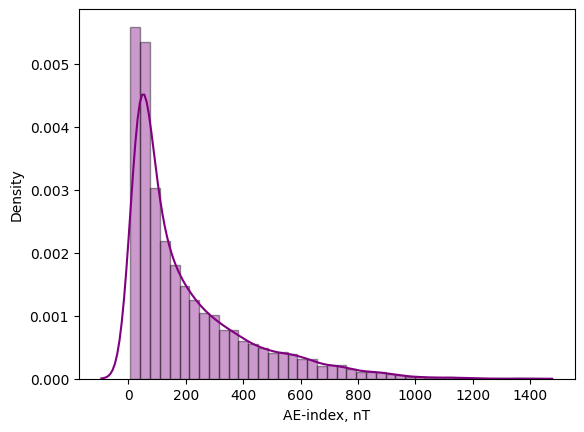

In [34]:
sns.distplot(a= e_index_1995["AE-index, nT"], bins=40, color='purple',
             hist_kws={"edgecolor": 'black'})

In [35]:
#merge column 
merged_df_E1 = e_index_1995.merge(df_1995, left_index= True, right_index = True)
merged_df_E1

,Year,Day of year,Hour_x,"Scalar B, nT","Vector B Magnitude,nT",Lat. Angle of B (GSE),Long.Angle of B (GSE),"BX, nT (GSE, GSM)","BY, nT (GSE)","BZ, nT (GSE)",...,"AE-index, nT",Date,Day-of-year,Time,hourly avg location for the magnetopause B_barre,hourly variance for the magnetopause,lifetime for the autocorrelation function,magnitude for radial diffusion,Hour_y,Total Minutes
0,1995.0,1.0,0.0,4.0,3.9,-32.9,100.8,-0.6,3.2,-2.1,...,32.0,1995-01-01,001,04:17,9.73,0.00360,2.05,-9.11,4,257.0
1,1995.0,1.0,1.0,3.0,2.9,-27.1,110.7,-0.9,2.4,-1.3,...,38.0,1995-01-01,001,04:19,9.73,0.00324,2.22,-9.12,4,259.0
2,1995.0,1.0,2.0,3.2,1.9,-13.0,75.1,0.5,1.8,-0.4,...,34.0,1995-01-01,001,04:21,9.73,0.00329,2.23,-9.12,4,261.0
3,1995.0,1.0,3.0,4.3,4.0,4.4,142.1,-3.2,2.5,0.3,...,36.0,1995-01-01,001,04:23,9.73,0.00320,2.25,-9.12,4,263.0
4,1995.0,1.0,4.0,4.8,4.8,3.9,154.3,-4.3,2.1,0.3,...,31.0,1995-01-01,001,04:24,9.73,0.00312,2.26,-9.13,4,264.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,1995.0,365.0,19.0,6.0,5.7,29.1,319.9,3.8,-3.2,2.8,...,248.0,1995-01-10,010,11:43,10.40,0.00867,1.17,-9.27,11,703.0
8756,1995.0,365.0,20.0,7.1,7.0,33.7,319.0,4.4,-3.8,3.9,...,90.0,1995-01-10,010,11:44,10.40,0.00852,1.17,-9.27,11,704.0
8757,1995.0,365.0,21.0,7.0,6.9,31.6,301.0,3.0,-5.0,3.6,...,34.0,1995-01-10,010,11:45,10.40,0.00837,1.17,-9.28,11,705.0
8758,1995.0,365.0,22.0,5.6,3.7,22.7,181.2,-3.5,-0.1,1.4,...,34.0,1995-01-10,010,11:46,10.40,0.00822,1.17,-9.29,11,706.0


In [36]:
_dntk.DeepnoteChart(merged_df_E1, """{"mark":{"type":"bar","tooltip":true},"$schema":"https://vega.github.io/schema/vega-lite/v4.json","encoding":{"x":{"sort":null,"type":"quantitative","field":"magnitude for radial diffusion","scale":{"type":"linear","zero":false}},"y":{"sort":null,"type":"quantitative","field":"Flow pressure","scale":{"type":"linear","zero":true}},"color":{"sort":null,"type":"nominal","field":"","scale":{"type":"linear","zero":false}}}}""")

In [37]:
_dntk.DeepnoteChart(merged_df_E1, """{"mark":{"type":"point","tooltip":true},"$schema":"https://vega.github.io/schema/vega-lite/v4.json","encoding":{"x":{"sort":null,"type":"quantitative","field":"AE-index, nT","scale":{"type":"linear","zero":false}},"y":{"sort":null,"type":"quantitative","field":"magnitude for radial diffusion","scale":{"type":"linear","zero":false}},"color":{"sort":null,"type":"quantitative","field":"Day of year","scale":{"type":"linear","zero":false}}}}""")

[Text(0.5, 1.0, 'Bivariate density plot of the AE-index and the Day of the Year')]

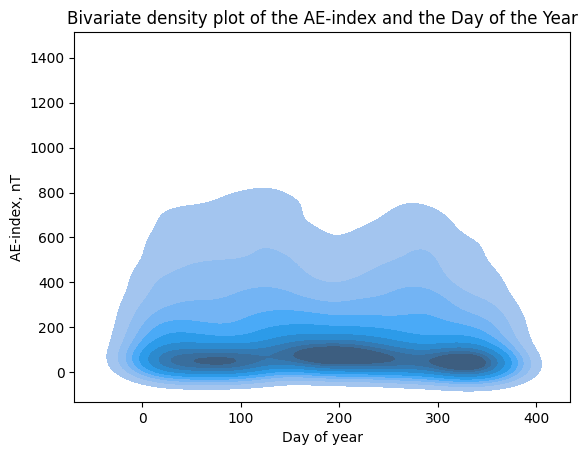

In [38]:
sns.kdeplot(data = merged_df_E1, x = "Day of year", y = "AE-index, nT", fill = True).set(title='Bivariate density plot of the AE-index and the Day of the Year')


[Text(0.5, 1.0, 'Bivariate density plot of the AE-index and the magntidue for radial diffusion')]

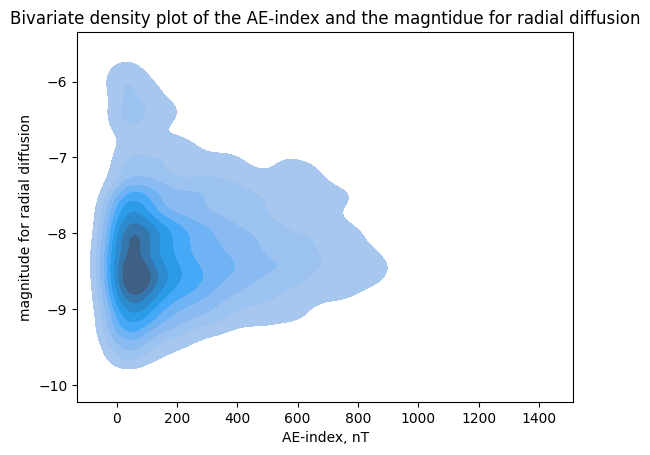

In [39]:
sns.kdeplot(data = merged_df_E1, x = "AE-index, nT", y = "magnitude for radial diffusion", fill = True).set(title='Bivariate density plot of the AE-index and the magntidue for radial diffusion')


[Text(0.5, 1.0, 'Bivariate density plot of flow pressure and the AE-index')]

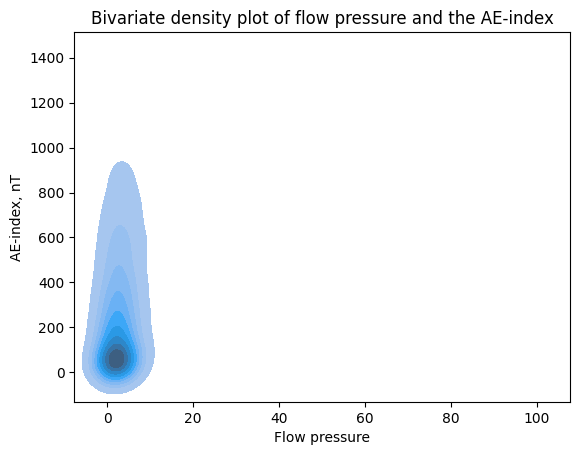

In [40]:
sns.kdeplot(data = merged_df_E1, x = "Flow pressure", y = "AE-index, nT", fill = True).set(title='Bivariate density plot of flow pressure and the AE-index')

## Analysis of the data

Combining our tables for AE-index, Kp-index, and magnitude of radial diffusion altogether, we noticed in analysis on our visualizations that there were some spots, albeit few, that interfered with the correct interpretation of these visualizations. Therefore, after evaluating our dataframe for NaN variables, we decided to clean up some of the rows that contained these values, finding that they only made up about 1% of our data. Exclusion of the NaN variables did not affect overall quartiles, and significantly helped with the precision of our mean and standard deviations.

Text(0.5, 0, 'Flow Pressure')

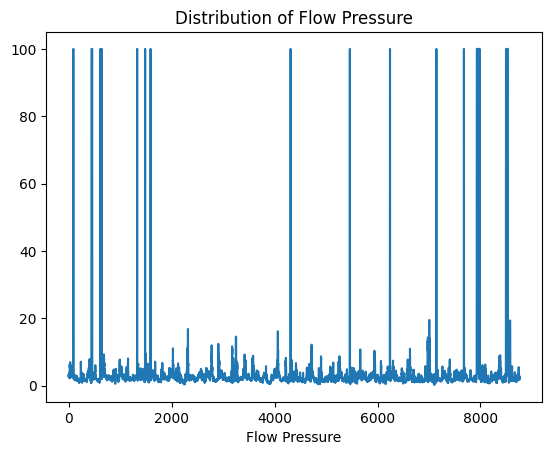

In [41]:
merged_df_E1["Flow pressure"].plot()
plt.title("Distribution of Flow Pressure")
plt.xlabel("Flow Pressure")

In [42]:
# small percentage of missing variables 
missing_percentage = len(merged_df_E1[merged_df_E1["Flow pressure"] == 99.99]) / len(merged_df_E1)
print("Percentage of missing data for flow pressure: " + str(missing_percentage))

Percentage of missing data for flow pressure: 0.014726027397260274


<AxesSubplot: title={'center': 'Distirbution of Flow Pressure after removing missing values'}, xlabel='Flow pressure'>

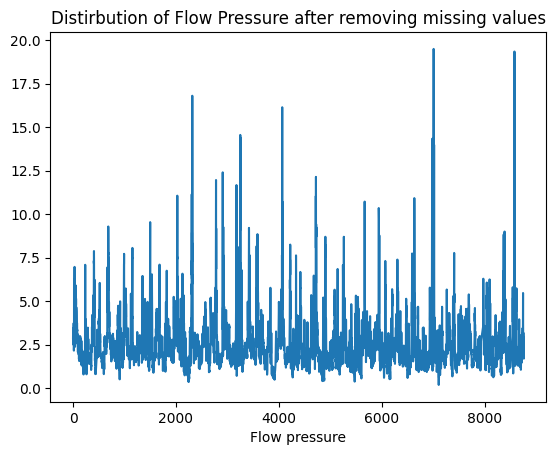

In [43]:
plt.title("Distirbution of Flow Pressure after removing missing values")
plt.xlabel("Flow pressure")
no_missing_flow_pressure = merged_df_E1[merged_df_E1["Flow pressure"] != 99.99]
no_missing_flow_pressure["Flow pressure"].plot()

In [44]:
merged_df_E1["Flow pressure"].describe()

count    8760.000000
mean        3.991226
std        11.830939
min         0.190000
25%         1.660000
50%         2.220000
75%         3.082500
max        99.990000
Name: Flow pressure, dtype: float64

In [45]:
no_missing_flow_pressure["Flow pressure"].describe()

count    8631.000000
mean        2.556416
std         1.499512
min         0.190000
25%         1.650000
50%         2.200000
75%         3.030000
max        19.490000
Name: Flow pressure, dtype: float64

[Text(0.5, 1.0, 'Bivariate density plot of flow pressure and the AE-index')]

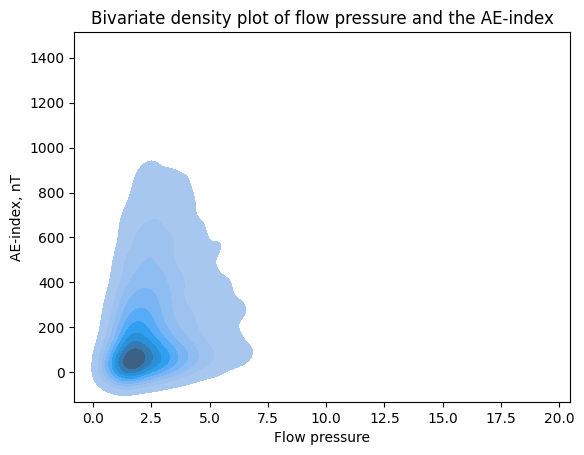

In [46]:
sns.kdeplot(data = no_missing_flow_pressure, x = "Flow pressure", y = "AE-index, nT", fill = True).set(title='Bivariate density plot of flow pressure and the AE-index')

### analysis on Plasma temperature

My first step is taking a look at the missing data and seeing what to do with it. I noticed that even though the percentage of missing data is less than 1%, removing the missing data seems to change the distribution

In [47]:
merged_df_E1["SW Plasma Temperature, K"].describe()

count    8.760000e+03
mean     2.386126e+05
std      1.196201e+06
min      7.517000e+03
25%      3.439850e+04
50%      6.360750e+04
75%      1.327995e+05
max      9.999999e+06
Name: SW Plasma Temperature, K, dtype: float64

In [48]:
missing_values_count =  sum(merged_df_E1["SW Plasma Temperature, K"] == 9999999.0) / len(merged_df_E1["SW Plasma Temperature, K"])
print("Missing value count: ", missing_values_count)

no_missing_plasma_temp = merged_df_E1[merged_df_E1["SW Plasma Temperature, K"] != 9999999.0]

no_missing_plasma_temp["SW Plasma Temperature, K"].describe()

Missing value count:  0.014726027397260274


count      8631.000000
mean      92717.743715
std       81829.416177
min        7517.000000
25%       34109.500000
50%       62452.000000
75%      128576.500000
max      722485.000000
Name: SW Plasma Temperature, K, dtype: float64

Text(0.5, 1.0, 'KDE plot of the SW Plasma Temperature, K before removing missing values')

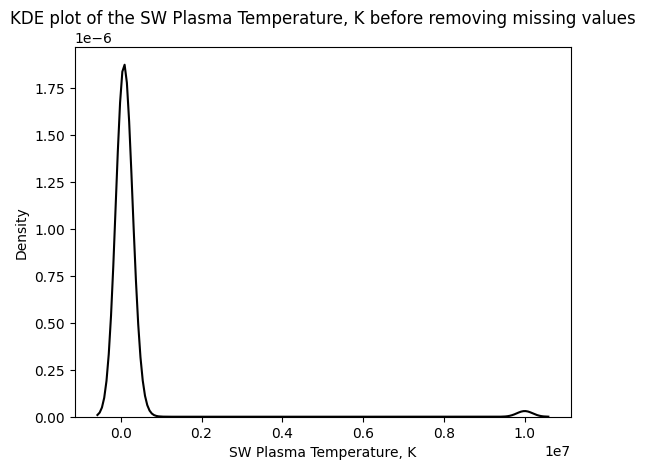

In [49]:
sns.kdeplot(merged_df_E1["SW Plasma Temperature, K"], color = 'k')
plt.title("KDE plot of the SW Plasma Temperature, K before removing missing values")

Text(0.5, 1.0, 'SW Plasma Temperature, K after removing missing values')

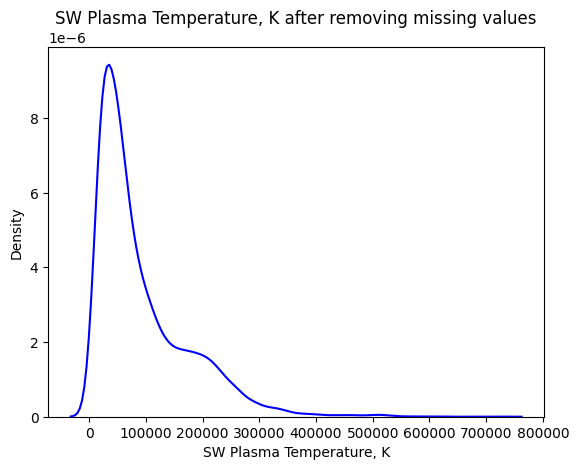

In [50]:
sns.kdeplot(no_missing_plasma_temp["SW Plasma Temperature, K"], color = 'b')
plt.title('SW Plasma Temperature, K after removing missing values')

Looking at these plots, I think we can conclude that removint the missing values will not change the data in any form

[Text(0.5, 1.0, 'Bivariate density plot of SW Plasma Temperature and the magntidue for radial diffusion')]

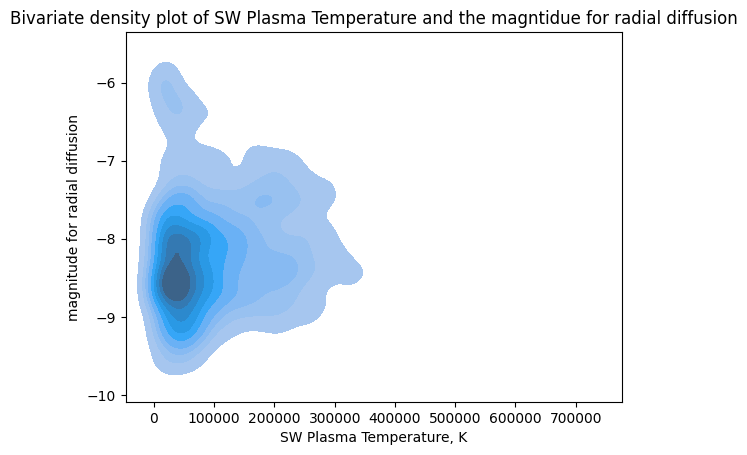

In [51]:
sns.kdeplot(data = no_missing_plasma_temp, x = "SW Plasma Temperature, K", y = "magnitude for radial diffusion", fill = True).set(title='Bivariate density plot of SW Plasma Temperature and the magntidue for radial diffusion')


In [52]:
correlation_plasma_diffusion = np.corrcoef(no_missing_plasma_temp["SW Plasma Temperature, K"], no_missing_plasma_temp["magnitude for radial diffusion"])
correlation_plasma_diffusion

array([[1.        , 0.10143873],
       [0.10143873, 1.        ]])

seems like there is a pretty low correlation for Plasma Temperature and magnitude for radial diffusion

# 11/10/22

multivariate analysis - compare for different values of Kp (table in the document) 

look at kp index AND another feature (plasma temp/flow pressure/etc) 

### Following the suggestion method data analysis

Text(0.5, 0, 'Median Kp-index')

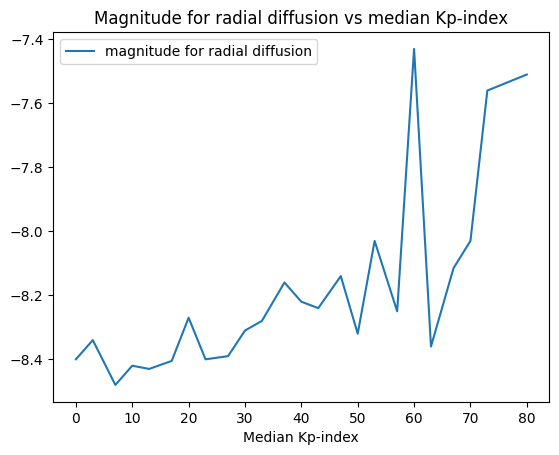

In [58]:
median_DDL_kp = merged_df.groupby("Kp-index").median()[["magnitude for radial diffusion"]]
median_DDL_kp.plot()
plt.title("Magnitude for radial diffusion vs median Kp-index")
plt.xlabel("Median Kp-index")

Text(0.5, 0, 'IQR of magnitude for radial diffusion')

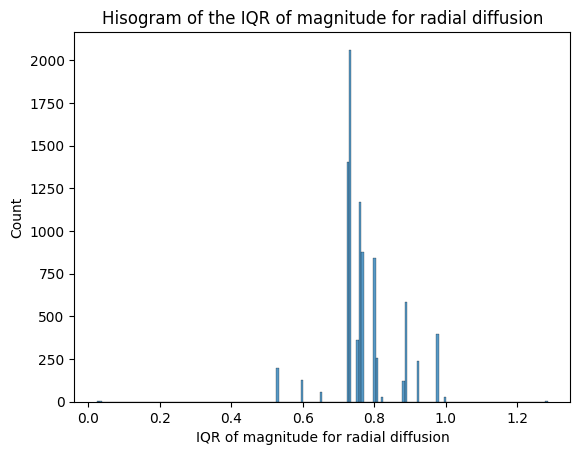

In [79]:
IQR_DDL_Kp = merged_df["Kp-index"].map(merged_df.groupby('Kp-index')["magnitude for radial diffusion"].agg(iqr))
sns.histplot(data = IQR_DDL_Kp)
plt.title("Hisogram of the IQR of magnitude for radial diffusion")
plt.xlabel("IQR of magnitude for radial diffusion")
#plt.ylabel("IQR Kp-index")


In [80]:
median_kp["hourly variance for the magnetopause"]

Kp-index
0     0.01570
3     0.01730
7     0.01520
10    0.01560
13    0.01590
17    0.01735
20    0.02010
23    0.01610
27    0.01720
30    0.01830
33    0.01950
37    0.02010
40    0.01950
43    0.02035
47    0.02280
50    0.02320
53    0.02480
57    0.02060
60    0.06380
63    0.02240
67    0.02540
70    0.01665
73    0.02450
80    0.02040
Name: hourly variance for the magnetopause, dtype: float64

In [93]:
median_kp = merged_df.groupby("Kp-index").median()
print("missing values: ", sum(merged_df["hourly variance for the magnetopause"].isna())) #this sum is equal to 0, which means we have no missing values

#median_loc = pd.qcut(x = merged_df["hourly variance for the magnetopause"], q = [0, 0.05, 0.2, 0.3, 0.5], labels =[0, 1, 2, 3], duplicates = 'drop')
# LABEL 0: VERY LOW, LABEL 1: LOW, LABEL 2: MEDIUM, LABEL 3: HIGH
#median_loc = median_loc.to_frame()
#median_kp["amount of hrly variance for the magnetopause"] = median_loc
#median_loc
#median_loc

missing values:  0


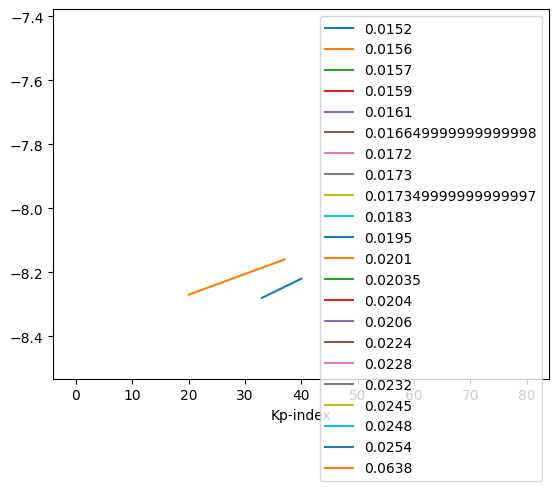

In [95]:
median_kp.groupby("hourly variance for the magnetopause")["magnitude for radial diffusion"].plot()
plt.legend()
#plt.text("LABEL 0: VERY LOW, LABEL 1: LOW, LABEL 2: MEDIUM, LABEL 3: HIGH")

In [96]:
median_kp.reset_index()

,Kp-index,Day-of-year_x,Hour_x,Total Hours,hourly avg location for the magnetopause B_barre,hourly variance for the magnetopause,lifetime for the autocorrelation function,magnitude for radial diffusion,Hour_y,Total Minutes
0,0,298.0,9.0,7150.0,10.100,0.01570,2.770,-8.400,10.0,606.0
1,3,194.0,12.0,4654.0,9.800,0.01730,2.370,-8.340,12.0,725.0
2,7,213.0,11.0,5102.5,9.860,0.01520,2.360,-8.480,10.5,658.0
3,10,192.0,12.0,4606.0,9.740,0.01560,2.260,-8.420,11.0,699.0
4,13,185.0,11.0,4435.0,9.730,0.01590,2.360,-8.430,11.0,695.0
5,17,196.0,12.0,4696.0,9.755,0.01735,2.320,-8.405,11.0,703.5
6,20,208.0,13.0,4972.0,9.760,0.02010,2.360,-8.270,11.0,669.0
7,23,184.0,11.0,4405.0,9.740,0.01610,2.210,-8.400,11.0,661.0
8,27,171.0,11.0,4090.0,9.700,0.01720,2.290,-8.390,10.0,642.0
9,30,153.0,12.0,3655.0,9.670,0.01830,2.320,-8.310,10.0,617.0


Text(0.5, 1.0, 'Magnitude for radial diffusion vs IQR Kp-index and hrly variance for the magnetopause')

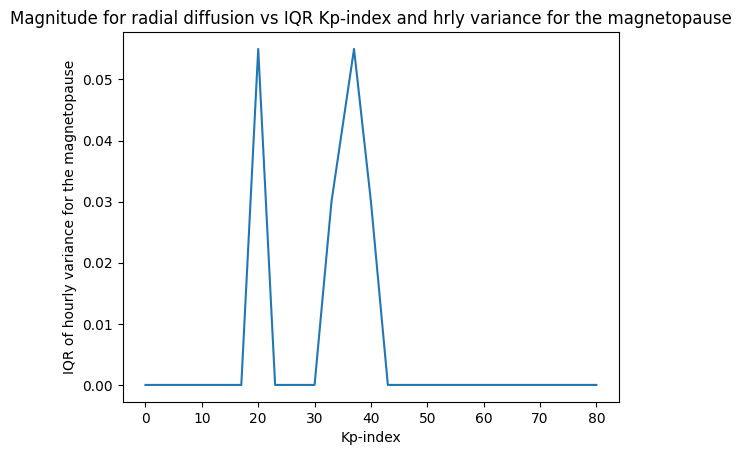

In [103]:
IQR_DDL_Kp_mp = median_kp["hourly variance for the magnetopause"].map(median_kp.groupby("hourly variance for the magnetopause")["magnitude for radial diffusion"].agg(iqr))
IQR_DDL_Kp_mp.plot()
plt.ylabel("IQR of hourly variance for the magnetopause")
plt.title("Magnitude for radial diffusion vs IQR Kp-index and hrly variance for the magnetopause")

Since the IQR decreased, we can conclude that the model improves when adding a new parameter (hrly variance for the magnetopause)

### lillian's work is now completed ^ 

In [ ]:
merged_df.columns.values

array(['Year', 'Day-of-year_x', 'Hour_x', 'Kp-index', 'Total Hours',
       'Date', 'Day-of-year_y', 'Time',
       'hourly avg location for the magnetopause B_barre',
       'hourly variance for the magnetopause',
       'lifetime for the autocorrelation function',
       'magnitude for radial diffusion', 'Hour_y', 'Total Minutes'],
      dtype=object)

In [ ]:
#create a function that looks at the correlation between all the variables 

In [ ]:
#i excluded the features that obviously didn't have have missing values - like time variables
merged_df_E1.columns.values
n = len(merged_df_E1.columns.values)
possible_features = merged_df_E1.columns.values[3:n-3]  
possible_features.indexOf('Date')
possible_features.indexOf('Day-of-year')
possible_features.indexOf('Time')
possible_features

AttributeError: 'numpy.ndarray' object has no attribute 'indexOf'

In [ ]:
for feature in possible_features:
    print(feature, type)

Scalar B, nT <class 'str'>
Vector B Magnitude,nT <class 'str'>
Lat. Angle of B (GSE) <class 'str'>
Long.Angle of B (GSE) <class 'str'>
BX, nT (GSE, GSM) <class 'str'>
BY, nT (GSE) <class 'str'>
BZ, nT (GSE) <class 'str'>
BY, nT (GSM) <class 'str'>
BZ, nT (GSM) <class 'str'>
RMS_magnitude, nT <class 'str'>
RMS_field_vector, nT <class 'str'>
RMS_BX_GSE, nT <class 'str'>
RMS_BY_GSE, nT <class 'str'>
RMS_BZ_GSE, nT <class 'str'>
SW Plasma Temperature, K <class 'str'>
SW Proton Density <class 'str'>
SW Plasma Speed <class 'str'>
SW Plasma flow long. angle <class 'str'>
SW Plasma long lat angle <class 'str'>
Alpha/Prot. ratio <class 'str'>
sigma-T, K <class 'str'>
sigma-n, N/cm^3 <class 'str'>
sigma-V <class 'str'>
sigma-phi V <class 'str'>
sigma-theta V <class 'str'>
sigma-ratio <class 'str'>
Flow pressure <class 'str'>
E electric field <class 'str'>
Plasma Beta <class 'str'>
Alfen mach number <class 'str'>
Magnetosonic Much num <class 'str'>
Quasy-Invariant <class 'str'>
AE-index, nT <clas

In [ ]:
#loop through all features and determine the correlations between that and magntiude for radial diffusion

for feature in possible_features:

    missing_value = merged_df_E1[feature].max()
    print(type(missing_value))
    if type(missing_value) :
        # if missing_value % 9 == 0: #if it's a missing value in the form 999999
        #     missing_percentage = sum(merged_df_E1[feature] == missing_value) / len(merged_df_E1)
    # print(feature, missing_percentage) printed this line and determined 

        feature_no_missing = merged_df_E1[merged_df_E1 != missing_value]
        corr = np.corrcoef(feature_no_missing[feature], feature_no_missing["magnitude for radial diffusion"])
        print(corr)
    else:
        continue

<class 'numpy.float64'>
[[nan nan]
 [nan  1.]]
<class 'numpy.float64'>
[[nan nan]
 [nan  1.]]
<class 'numpy.float64'>
[[nan nan]
 [nan  1.]]
<class 'numpy.float64'>
[[nan nan]
 [nan  1.]]
<class 'numpy.float64'>
[[nan nan]
 [nan  1.]]
<class 'numpy.float64'>
[[nan nan]
 [nan  1.]]
<class 'numpy.float64'>
[[nan nan]
 [nan  1.]]
<class 'numpy.float64'>
[[nan nan]
 [nan  1.]]
<class 'numpy.float64'>
[[nan nan]
 [nan  1.]]
<class 'numpy.float64'>
[[nan nan]
 [nan  1.]]
<class 'numpy.float64'>
[[nan nan]
 [nan  1.]]
<class 'numpy.float64'>
[[nan nan]
 [nan  1.]]
<class 'numpy.float64'>
[[nan nan]
 [nan  1.]]
<class 'numpy.float64'>
[[nan nan]
 [nan  1.]]
<class 'numpy.float64'>
[[nan nan]
 [nan  1.]]
<class 'numpy.float64'>
[[nan nan]
 [nan  1.]]
<class 'numpy.float64'>
[[nan nan]
 [nan  1.]]
<class 'numpy.float64'>
[[nan nan]
 [nan  1.]]
<class 'numpy.float64'>
[[nan nan]
 [nan  1.]]
<class 'numpy.float64'>
[[nan nan]
 [nan  1.]]
<class 'numpy.float64'>
[[nan nan]
 [nan  1.]]
<class 'numpy

TypeError: The DType <class 'numpy.dtype[float64]'> could not be promoted by <class 'numpy.dtype[datetime64]'>. This means that no common DType exists for the given inputs. For example they cannot be stored in a single array unless the dtype is `object`. The full list of DTypes is: (<class 'numpy.dtype[float64]'>, <class 'numpy.dtype[datetime64]'>, <class 'numpy.dtype[float64]'>)

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=28a83fbe-9ed8-4ad0-ab71-9db262ace005' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>